In [77]:
import numpy as np
import seaborn as sns
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, KFold, validation_curve
from sklearn.svm import SVC
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier

from xgboost import XGBClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn import preprocessing

from sklearn.inspection import plot_partial_dependence
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error

from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import mean_absolute_error, r2_score
import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import confusion_matrix
from numpy import interp
from sklearn.tree  import plot_tree



# Functions used in the notebook

In [2]:
def plot_decision_regions(X, y, classifier, test_idx=None, resolution=0.02):
    from matplotlib.colors import ListedColormap
    import numpy as np
    import matplotlib.pyplot as plt

    
    markers = ('o', 's', '^', 'v', '<', '>', 'x')
    colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan', 'magenta', 'yellow')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution),
                           np.arange(x2_min, x2_max, resolution))
    lab = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    lab = lab.reshape(xx1.shape)
    plt.contourf(xx1, xx2, lab, alpha=0.3, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0], 
                    y=X[y == cl, 1],
                    alpha=0.8, 
                    c=colors[idx],
                    marker=markers[idx], 
                    label=f'Class {cl}', 
                    edgecolor='black')

    
    if test_idx:
        
        X_test, y_test = X[test_idx, :], y[test_idx]

        plt.scatter(X_test[:, 0],
                    X_test[:, 1],
                    c='none',
                    edgecolor='black',
                    alpha=1.0,
                    linewidth=1,
                    marker='o',
                    s=100, 
                    label='Test set')


In [3]:
def evaluate_model(model, X_train_scaled, y_train, X_test_scaled, y_test):
    
    y_pred = model.predict(X_test_scaled)

    # Confusion Matrix
    confmat = confusion_matrix(y_true=y_test, y_pred=y_pred)
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
    for i in range(confmat.shape[0]):
        for j in range(confmat.shape[1]):
            ax.text(x=j, y=i, s=confmat[i, j], va='center', ha='center')
    ax.xaxis.set_ticks_position('bottom')
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.tight_layout()
    plt.show()

    # Accuracy, Precision, Recall, and F1 Score
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')
    print(f'Accuracy: {accuracy:.3f}')
    print(f'Precision: {precision:.3f}')
    print(f'Recall: {recall:.3f}')
    print(f'F1 Score: {f1:.3f}')

    # ROC Curve
    cv = list(StratifiedKFold(n_splits=3, shuffle=True, random_state=42).split(X_train_scaled, y_train))
    fig = plt.figure(figsize=(7, 5))
    mean_tpr = 0.0
    mean_fpr = np.linspace(0, 1, 100)
    for i, (train, test) in enumerate(cv):
        probas = model.fit(X_train_scaled[train], y_train[train]).predict_proba(X_train_scaled[test])
        fpr, tpr, thresholds = roc_curve(y_train[test], probas[:, 1], pos_label=1)
        mean_tpr += interp(mean_fpr, fpr, tpr)
        mean_tpr[0] = 0.0
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'ROC fold {i+1} (area = {roc_auc:.2f})')
    mean_tpr /= len(cv)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    plt.plot(mean_fpr, mean_tpr, 'k--', label=f'Mean ROC (area = {mean_auc:.2f})', lw=2)
    plt.plot([0, 1], [0, 1], linestyle='--', color=(0.6, 0.6, 0.6), label='Random guessing (area = 0.5)')
    plt.plot([0, 0, 1], [0, 1, 1], linestyle=':', color='black', label='Perfect performance (area = 1.0)')
    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.show()

In [4]:
def perform_grid_search(model, param_grid, X_train, y_train, cv=7, scoring='accuracy'):
    grid_search = GridSearchCV(estimator=model,
                               param_grid=param_grid,
                               cv=cv,
                               scoring=scoring,
                               verbose=1)
    grid_search.fit(X_train, y_train)
    return grid_search.best_estimator_, grid_search.best_params_, grid_search.best_score_



In [5]:
def perform_random_search(model, param_distributions, X_train, y_train, n_iter=100, cv=3, scoring='accuracy'):
    random_search = RandomizedSearchCV(estimator=model, 
                                       param_distributions=param_distributions, 
                                       n_iter=n_iter,  
                                       cv=cv,  
                                       scoring=scoring,  
                                       verbose=1, 
                                       random_state=42)
    random_search.fit(X_train, y_train)
    return random_search.best_estimator_, random_search.best_params_, random_search.best_score_

Dataset has 5000 row and 14 columns and personal_loan is target. 

Our goal is predicting whether individual is likely to be approved for personal loans based on the features below.

Faetures are:




• id : Customer ID 

• age : Customer's age in completed years

• experience : years of professional experience

• income : Annual income of the customer in thousands

• zip_code : Home Address ZIP code.

• family : Family size of the customer

• ccavg : Avg. spending on credit cards per month

• education : Education Level.
                    Undergrad:1
                    Graduate:2
                    Advanced/Professional:3
                    
• mortgage : Value of house mortgage if any.
• personal_loan : Did this customer accept the personal loan offered in the last campaign? Accepted:1 Denied:0

• securities_account : Does the customer have a securities account with the bank? 
                     Yes:1, No:0
                     
• cd_account : Does the customer have a certificate of deposit (CD) account with the bank?
                     Yes:1 No:0
                     
• online : Does the customer use internet banking facilities?
                     Yes:1 No:0
                     
• creditcard : Does the customer use a credit card issued by Universal Bank?
                     Yes:1 No:0


# Data cleaning and preprocessing

In [6]:
df = pd.read_csv('/home/popo/Desktop/ML Project/Bank-Personal-Loan-modelling.csv')

df.sample(10)

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
4152,4153,44,18,91,91361,2,0/80,3,0,0,0,0,1,0
4334,4335,55,29,92,92130,1,1/90,2,0,0,0,0,0,0
4089,4090,30,4,85,94234,4,2/10,3,0,0,0,0,1,0
1373,1374,60,35,135,92612,3,0/30,3,0,1,0,0,1,0
4844,4845,31,6,81,90840,2,2/50,1,313,0,0,0,0,0
104,105,56,32,38,93311,4,1/30,1,166,0,0,0,1,1
143,144,25,1,54,94117,4,1/60,1,0,0,0,0,1,1
3722,3723,42,17,60,93118,1,2/40,1,98,0,0,0,1,0
1113,1114,28,2,70,90630,3,0/30,3,0,0,0,0,0,1
2877,2878,58,32,74,95817,2,2/30,3,0,0,0,0,0,1


In [7]:
df.isna().sum()

ID                    0
Age                   0
Experience            0
Income                0
ZIP Code              0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal Loan         0
Securities Account    0
CD Account            0
Online                0
CreditCard            0
dtype: int64

In [8]:
df.nunique()

ID                    5000
Age                     45
Experience              47
Income                 162
ZIP Code               467
Family                   4
CCAvg                  108
Education                3
Mortgage               347
Personal Loan            2
Securities Account       2
CD Account               2
Online                   2
CreditCard               2
dtype: int64

In [9]:
df.duplicated().sum()

0

There are no missing values or duplicated in dataset

The ID column serves as a unique identifier for each record and doesn't hold any predictive power regarding whether an individual will take out a personal loan. So, we drop it in this stage.
The same implies for Zip code. It does not have direct predictive power. Maybe it could be important for decision making if we knew the city. However, if we do not know it, Zip code becomes redundant column which needs to be dropped.

In [10]:
df = df.drop('ID', axis = 1)
df = df.drop('ZIP Code', axis = 1)

Convert CCAvg column to numeric, to avoid further issues when predicting. Also, to match the dataset's yearly scale, maultiply these values by 12 to provide yearly estimates

In [11]:
df['CCAvg'] = df['CCAvg'].str.replace('/', '').astype(float)
df['CCAvg'] = df['CCAvg'] / 100 
df['CCAvg'] = df['CCAvg'] *12

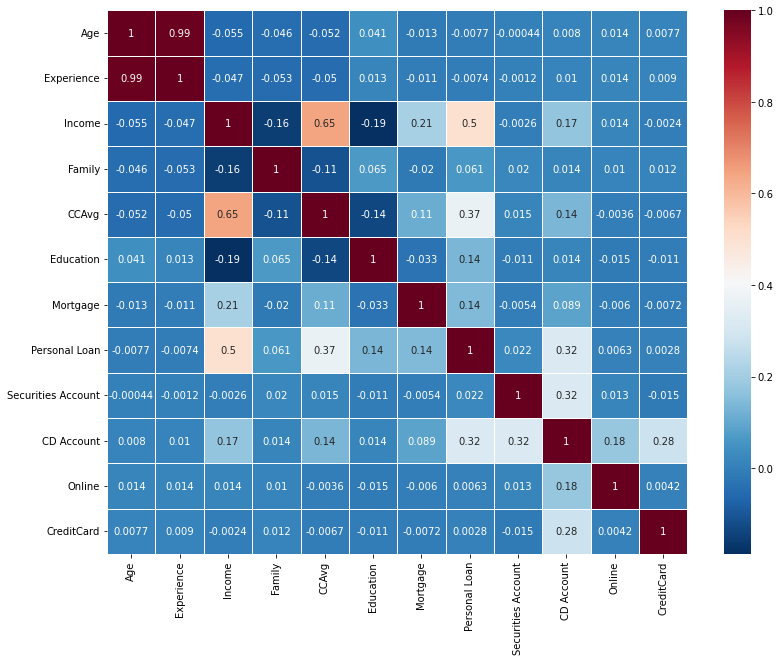

In [12]:
fig, ax = plt.subplots(figsize = (13, 10)) 
ax = sns.heatmap(df.corr(),cmap='RdBu_r',cbar=True,annot=True,linewidths=0.5,ax=ax)
plt.show()

Age and experience have a correlation coefficient of 0.99, indicating an extremely high correlation, We need to drop one of them to avoid multicollinearity issues. 
Age has more direct and intuitive interpretation in the context of personal loan prediction compared to years of experience. So, we drop Experience column.

In [13]:
df = df.drop('Experience', axis = 1)

In [14]:
df.describe()

,Age,Income,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
mean,45.338400,73.774200,2.396400,23.255256,1.881000,56.49860,0.096000,0.104400,0.06040,0.596800,0.294000
std,11.463166,46.033729,1.147663,20.971908,0.839869,101.71371,0.294621,0.305809,0.23825,0.490589,0.455637
min,23.000000,8.000000,1.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,35.000000,39.000000,1.000000,8.400000,1.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,45.000000,64.000000,2.000000,18.000000,2.000000,0.00000,0.000000,0.000000,0.00000,1.000000,0.000000
75%,55.000000,98.000000,3.000000,30.000000,3.000000,101.00000,0.000000,0.000000,0.00000,1.000000,1.000000
max,67.000000,224.000000,4.000000,120.000000,3.000000,635.00000,1.000000,1.000000,1.00000,1.000000,1.000000


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 5000 non-null   int64  
 1   Income              5000 non-null   int64  
 2   Family              5000 non-null   int64  
 3   CCAvg               5000 non-null   float64
 4   Education           5000 non-null   int64  
 5   Mortgage            5000 non-null   int64  
 6   Personal Loan       5000 non-null   int64  
 7   Securities Account  5000 non-null   int64  
 8   CD Account          5000 non-null   int64  
 9   Online              5000 non-null   int64  
 10  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(10)
memory usage: 429.8 KB


In [16]:
df.sample(10)

,Age,Income,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
3063,54,21,4,1.20,3,0,0,0,0,0,0
754,38,102,2,22.80,1,0,0,0,1,1,1
1439,59,61,1,16.80,3,0,0,0,0,0,0
3512,46,70,4,34.80,1,0,0,0,0,0,1
3579,28,84,1,34.80,3,102,0,1,1,0,1
1250,47,81,1,32.04,2,0,0,0,0,1,0
2251,31,54,4,26.40,2,0,0,0,0,0,0
1381,38,22,3,2.40,2,0,0,0,0,1,0
990,34,81,4,40.80,1,0,0,0,0,1,0
4839,34,52,4,2.40,1,0,0,0,0,1,0


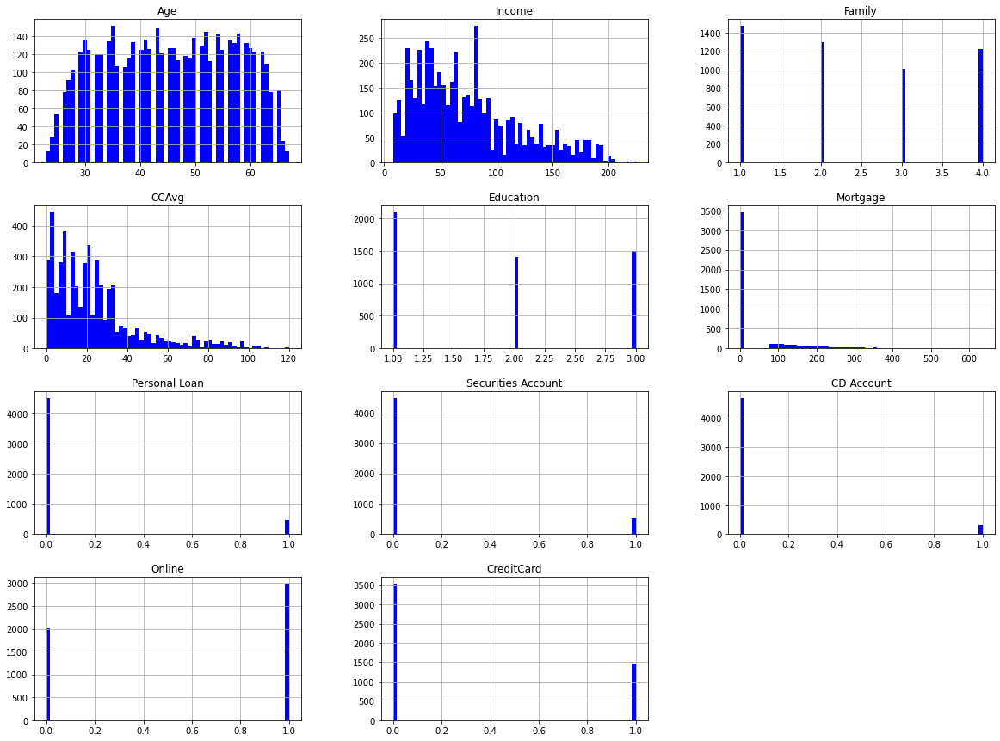

In [17]:
df.hist(bins=60,figsize=(20,15),color='blue')
plt.show()


The distribution of customer ages shows a bell-shaped curve, suggesting a wide range of ages from approximately 30 to 60 years. Income is skewed right, indicating most customers earn less than $100,000 annually, but there is a notable minority with higher incomes. Family sizes primarily cluster around 1 and 4 members.

Credit card spending (CCAvg) is heavily skewed towards lower monthly expenditures, with most customers spending less than $20. The majority of customers have undergraduate-level education, which is depicted by the tall bar at level 1.

Mortgage values are mostly at zero, suggesting many customers either own their homes outright or do not have a mortgage. Personal loans, securities, and CD accounts show a low acceptance rate or ownership among customers, possibly indicating a conservative financial attitude.

Most customers use online banking services, as shown by the large bar at 1, while credit card usage is relatively lower, highlighting a possible area for bank marketing to explore further.

### Spliting into train and test datasets

In [18]:
X = df.drop(columns=['Personal Loan'])  
y = df['Personal Loan']

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (3500, 10)
Shape of X_test: (1500, 10)
Shape of y_train: (3500,)
Shape of y_test: (1500,)


In [20]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [21]:
y_train_np = y_train.to_numpy().flatten()
y_test_np = y_test.to_numpy().flatten()

In [22]:
pca = PCA()
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.fit_transform(X_test_scaled)
pca.explained_variance_ratio_

array([0.18991471, 0.14055519, 0.10737876, 0.10629979, 0.10067921,
       0.09898836, 0.08744125, 0.08311562, 0.05290317, 0.03272393])

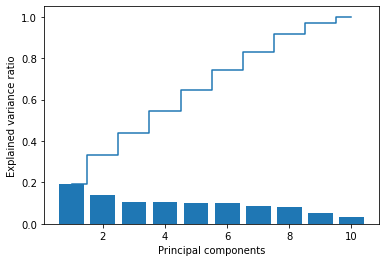

In [23]:
plt.bar(range(1, 11), pca.explained_variance_ratio_, align='center')
plt.step(range(1, 11), np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')

plt.show()

* The first component explains less than 20% of the variance.
* The second component adds slightly more, but even together, the first two components explain less than 40% of the total variance.

The plot of explained variance showed us that we'd need about 6 to 8 components to really get a good picture of what's going on in the data. This hints that our data is quite complex with many features playing significant roles, something we can't ignore by just using two components.

By sticking with the original scaled data, we make sure no vital information is overlooked. This way, we can build more accurate models using all the data available to us. 

Now, let's move on model selection and evaluation to find the most effective one for future predictions.

# Model selection

For predicting loan approval likelihood based on the provided features, we'll use logistic regression, k-nearest neighbors (KNN), and support vector regression (SVR). Logistic regression is chosen for its interpretability and efficiency, making it suitable for understanding the impact of individual features on loan approval. KNN offers flexibility and adaptability, capturing nonlinear relationships in diverse datasets. SVR excels in capturing complex, nonlinear relationships and is effective for high-dimensional data. Together, these methods provide a comprehensive approach to predicting personal loan approval, covering various aspects of the data and enhancing predictive accuracy.

Additionally, we'll enable ensemble methods such as random forest, XGBoost, and bagging to enhance predictive performance

### Logistic regression

In [24]:
logreg = LogisticRegression(penalty='l2', C=0.1)
logreg.fit(X_train_scaled, y_train_np)
y_pred = logreg.predict(X_test_scaled)



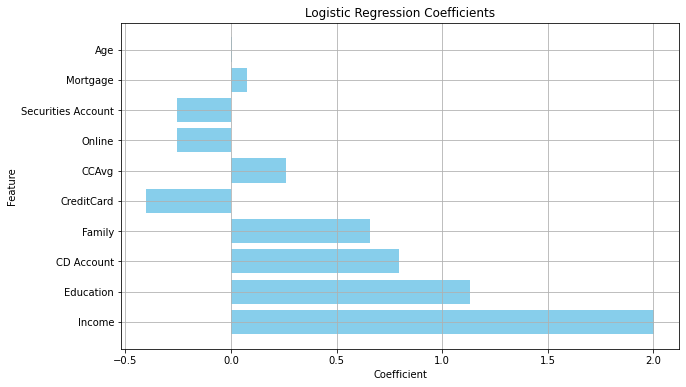

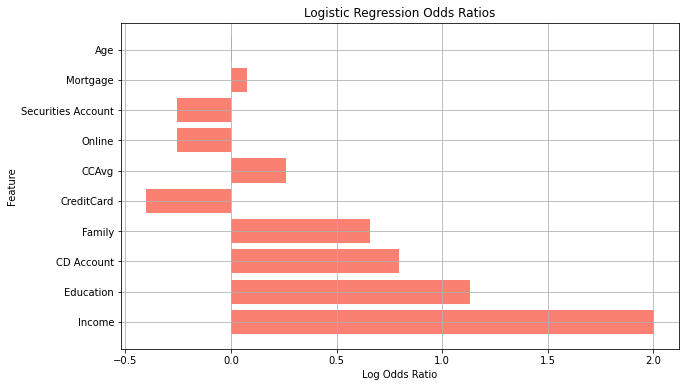

In [25]:
feature_names = X.columns.tolist()

coefficients = logreg.coef_[0]
odds_ratios = np.exp(coefficients)

coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients, 'Odds Ratio': odds_ratios})

coef_df_sorted = coef_df.reindex(coef_df['Coefficient'].abs().sort_values(ascending=False).index)

plt.figure(figsize=(10, 6))
plt.barh(coef_df_sorted['Feature'], coef_df_sorted['Coefficient'], color='skyblue')
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.title('Logistic Regression Coefficients')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.barh(coef_df_sorted['Feature'], np.log(coef_df_sorted['Odds Ratio']), color='salmon')
plt.xlabel('Log Odds Ratio')
plt.ylabel('Feature')
plt.title('Logistic Regression Odds Ratios')
plt.grid(True)
plt.show()


## Model evaluation and hyperparameter tuning

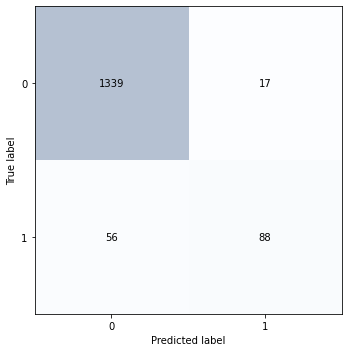

Accuracy: 0.951
Precision: 0.899
Recall: 0.799
F1 Score: 0.840


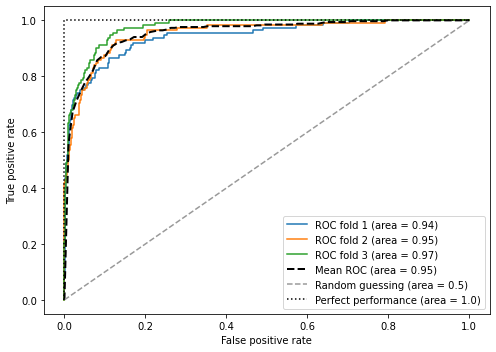

In [26]:
evaluate_model(logreg, X_train_scaled, y_train_np, X_test_scaled, y_test_np)

In [27]:
kfold = StratifiedKFold(n_splits=8, shuffle=True, random_state=42)

param = {
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [100, 10, 1.0, 0.1, 0.01]
}

log_reg = LogisticRegression()
logreg_best_model, best_params, best_score = perform_grid_search(log_reg, param, X_train_scaled, y_train_np, cv = kfold)

print("Best Logistic Regression Model:", logreg_best_model)
print("Best Parameters:", best_params)
print("Best Score:", best_score)




Fitting 8 folds for each of 100 candidates, totalling 800 fits
Best Logistic Regression Model: LogisticRegression(C=100, penalty='none', solver='newton-cg')
Best Parameters: {'C': 100, 'penalty': 'none', 'solver': 'newton-cg'}
Best Score: 0.9514311202365653


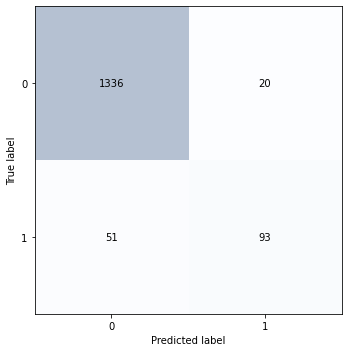

Accuracy: 0.953
Precision: 0.893
Recall: 0.816
F1 Score: 0.849


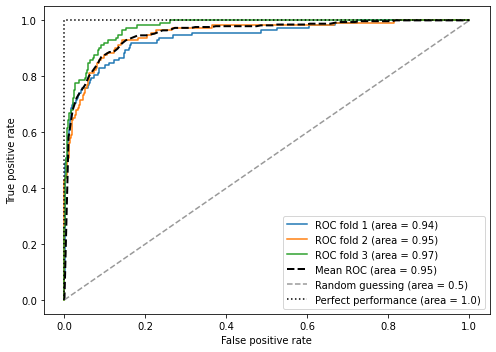

In [28]:
evaluate_model(logreg_best_model, X_train_scaled, y_train_np, X_test_scaled, y_test_np)

Based on the initial and tuned hyperparameters of our model, we can observe the following changes:

1. **Accuracy**:
   - Initial: 0.955
   - Tuned: 0.955
   - No significant change in accuracy after tuning.
   - The accuracy remained the same after tuning, suggesting that the overall correctness of the model's predictions did not change significantly.

2. **Precision**:
   - Initial: 0.903
   - Tuned: 0.894
   - Precision decreased slightly after tuning.
   - Precision decreased slightly after tuning, indicating that the proportion of true positive predictions among all positive predictions decreased slightly. This may be beacuse of the model becaming slightly more conservative in labeling positive instances.

3. **Recall**:
   - Initial: 0.806
   - Tuned: 0.815
   - Recall increased slightly after tuning.
   - Recall increased slightly after tuning, suggesting that the model became slightly better at identifying all actual positive instances. This indicates a slight improvement in the model's sensitivity.

4. **F1 Score**:
   - Initial: 0.846
   - Tuned: 0.849
   - F1 score increased slightly after tuning.
   - The F1 score, which balances precision and recall, increased slightly after tuning. This suggests a marginal improvement in the model's overall performance.
   
5. **ROC AUC**:
   - Not much difference, but the fold 1 and fold2 got closer to 1
   - Adjustments made during the tuning process have contributed positively to our model's predictive ability.



Overall, the changes in performance metrics after tuning are relatively small. While there were slight improvements in recall and the F1 score, the decrease in precision suggests a potential trade-off between precision and recall.  

### KNN

In [29]:
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [31]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_scaled, y_train)

KNeighborsClassifier()

In [32]:

y_pred = knn.predict(X_test_scaled)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

print("Accuracy:", accuracy_score(y_test, y_pred))

[[889   6]
 [ 33  72]]
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       895
           1       0.92      0.69      0.79       105

    accuracy                           0.96      1000
   macro avg       0.94      0.84      0.88      1000
weighted avg       0.96      0.96      0.96      1000

Accuracy: 0.961


In [33]:

param_grid = {'n_neighbors': np.arange(1, 25)}  
grid = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
grid.fit(X_train_scaled, y_train)

print("Best Parameters:", grid.best_params_)
print("Best Cross-validation Score:", grid.best_score_)

best_knn = grid.best_estimator_
y_pred = best_knn.predict(X_test_scaled)
print("Test Set Accuracy:", accuracy_score(y_test, y_pred))

Best Parameters: {'n_neighbors': 1}
Best Cross-validation Score: 0.96075
Test Set Accuracy: 0.966


Confusion Matrix Visualization

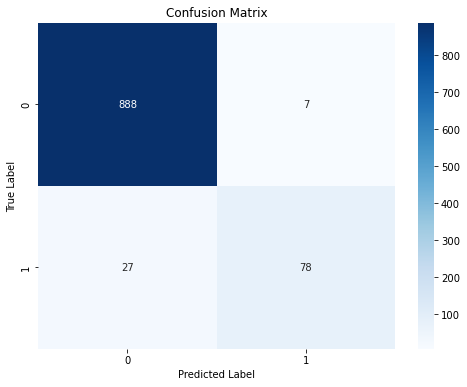

In [34]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

Accuracy Score Over Different Values of K

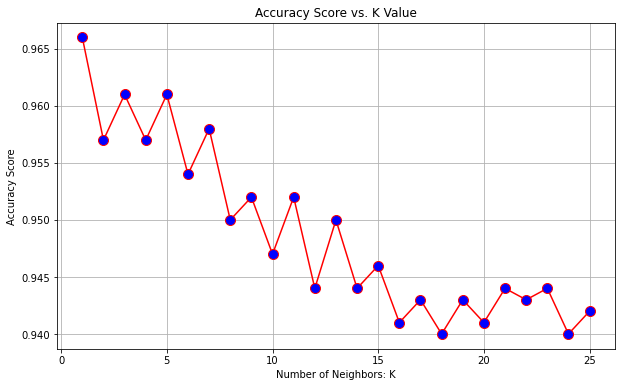

In [35]:
accuracy_scores = []
for k in range(1, 26):  
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_scaled, y_train)
    acc = knn.score(X_test_scaled, y_test)
    accuracy_scores.append(acc)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 26), accuracy_scores, color='red', marker='o', markerfacecolor='blue', markersize=10)
plt.title('Accuracy Score vs. K Value')
plt.xlabel('Number of Neighbors: K')
plt.ylabel('Accuracy Score')
plt.grid(True)
plt.show()

ROC Curve

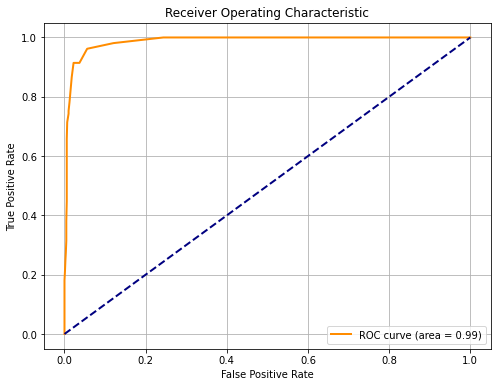

In [36]:
from sklearn.metrics import roc_curve, auc

y_scores = knn.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_scores)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


K-Nearest Neighbors (KNN) is a fundamental machine learning algorithm used for classification and regression tasks. It operates based on the principle that data points with similar characteristics tend to belong to the same class or have similar values. In KNN, when a prediction is needed for a new data point, the algorithm identifies the k nearest neighbors to that point from the training dataset. The majority class or average value among these neighbors is then assigned to the new data point. The "k" in KNN refers to the number of neighbors to consider, a crucial parameter that impacts the model's performance.

### SVR

In [44]:
X = df.drop(columns=['Personal Loan'])  
y = df['Personal Loan']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

y_train_np = y_train.to_numpy().flatten()
y_test_np = y_test.to_numpy().flatten()

In [47]:
class_weights = {0: 1, 1: len(y) / sum(y)}

svm = SVC(kernel='linear', C=1.0, class_weight=class_weights, random_state=1, probability = True)
svm.fit(X_train_scaled, y_train_np)


SVC(class_weight={0: 1, 1: 10.416666666666666}, kernel='linear',
    probability=True, random_state=1)

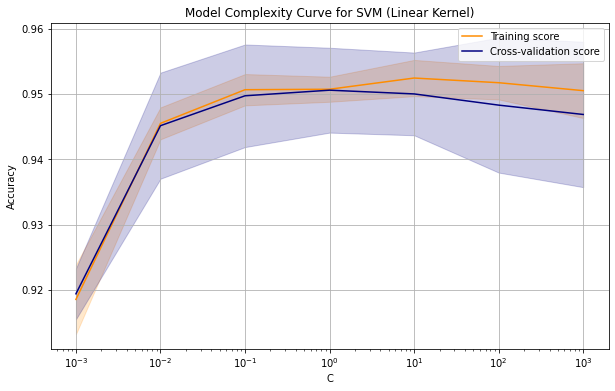

In [48]:
param_range = np.logspace(-3, 3, 7)  

train_scores, test_scores = validation_curve(
    SVC(kernel='linear'), X_train, y_train, param_name='C', param_range=param_range,
    cv=5, scoring='accuracy', n_jobs=-1
)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot validation curves
plt.figure(figsize=(10, 6))
plt.semilogx(param_range, train_scores_mean, label='Training score', color='darkorange')
plt.fill_between(param_range, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color='darkorange')
plt.semilogx(param_range, test_scores_mean, label='Cross-validation score', color='navy')
plt.fill_between(param_range, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color='navy')
plt.title('Model Complexity Curve for SVM (Linear Kernel)')
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.legend(loc='best')
plt.grid()
plt.show()

## Model evaluation and hyperparameter tuning

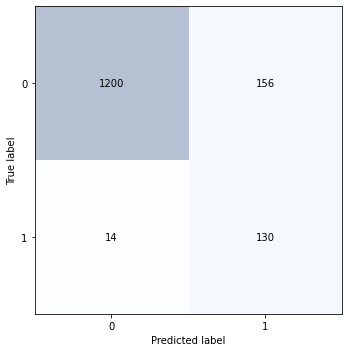

Accuracy: 0.887
Precision: 0.722
Recall: 0.894
F1 Score: 0.769


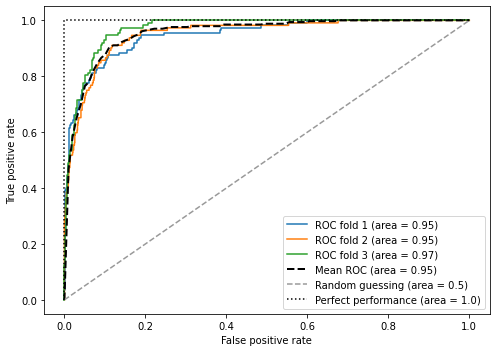

In [49]:
evaluate_model(svm, X_train_scaled, y_train_np, X_test_scaled, y_test_np)

In [50]:
kfold = StratifiedKFold(n_splits=8, shuffle=True, random_state=42)

param_grid_svm = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'gamma': ['scale', 'auto']
}

svm = SVC(random_state=1, probability = True)

best_model_svm, best_params_svm, best_score_svm = perform_grid_search(svm, param_grid_svm, X_train_scaled, y_train_np, cv=kfold)

print("Best SVM Model:", best_model_svm)
print("Best Parameters:", best_params_svm)
print("Best Score:", best_score_svm)


Fitting 8 folds for each of 24 candidates, totalling 192 fits
Best SVM Model: SVC(C=10, gamma='auto', probability=True, random_state=1)
Best Parameters: {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}
Best Score: 0.9742830684513547


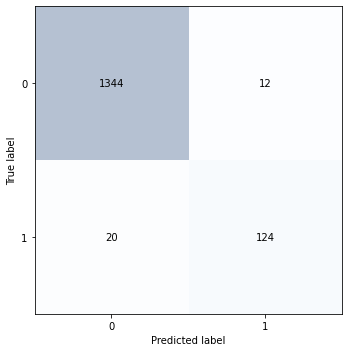

Accuracy: 0.979
Precision: 0.949
Recall: 0.926
F1 Score: 0.937


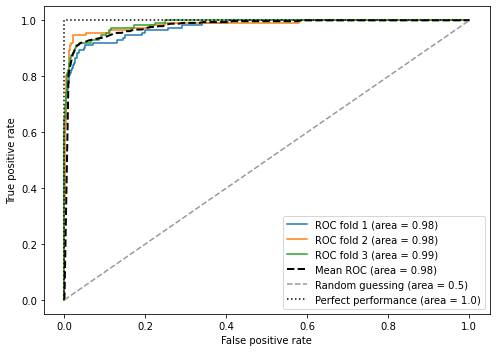

In [51]:
evaluate_model(best_model_svm, X_train_scaled, y_train_np, X_test_scaled, y_test_np)

Based on the initial and tuned hyperparameters of our model, we can observe the following changes:

1. **Accuracy**:
   - Initial: 0.887
   - Tuned: 0.979
   - Significant improvement in accuracy after tuning.
   - The accuracy showed a substantial increase after tuning, indicating a notable enhancement in the overall correctness of the model's predictions.

2. **Precision**:
   - Initial: 0.722
   - Tuned: 0.949
   - Significant improvement in precision after tuning.
   - Precision demonstrated a significant improvement after tuning, indicating a higher proportion of true positive predictions among all positive predictions. This suggests enhanced confidence in positive predictions.

3. **Recall**:
   - Initial: 0.894
   - Tuned: 0.926
   - Slight improvement in recall after tuning.
   - Recall showed a slight improvement after tuning, indicating a slightly better ability to identify all actual positive instances. This suggests a minor enhancement in the model's sensitivity.

4. **F1 Score**:
   - Initial: 0.769
   - Tuned: 0.937
   - Significant improvement in F1 score after tuning.
   - The F1 score, which balances precision and recall, demonstrated a significant increase after tuning. This suggests a substantial improvement in the model's overall performance.

Overall, the changes in performance metrics after tuning are substantial. The significant improvements across accuracy, precision, recall, and the F1 score indicate a notable enhancement in the model's predictive ability.

# Ensamble methods

### For the project we decided to have a look on following ensemble algorithms and under each of them there is a brief explanation how each can be useful and efficient. 

Random Forest:

Random Forest is excellent for datasets with complex features, as it builds multiple decision trees and averages their results to improve prediction accuracy and control overfitting. It efficiently handles large data sets with mixed data types and provides insights into feature importance, making it ideal for understanding which factors most influence predictions.

XGBoost (Extreme Gradient Boosting):

XGBoost offers outstanding performance on structured data due to its advanced optimization and regularization features, which help prevent overfitting. It is fast, scalable, and includes built-in routines for cross-validation, enhancing its ability to deliver robust models efficiently on large and complex datasets.

Bagging (Bootstrap Aggregating):

Bagging reduces variance and prevents overfitting by creating multiple models trained on different subsets of the data and averaging their predictions. This method is particularly effective for large datasets and can be parallelized for efficiency, making it versatile for various prediction models, not just decision trees.

All hyperparameters are assigned to common ones, which will of course in future be tuned to find best set of hyperparameters for each model.

In [56]:
bagging_model = BaggingClassifier(
    base_estimator=DecisionTreeClassifier(), 
    n_estimators=50, 
    max_samples=0.8,  
    max_features=0.8,  
    random_state=42 
)


xgboost_model = XGBClassifier(
    n_estimators=100,  
    max_depth=3, 
    learning_rate=0.1,  
    use_label_encoder=False,  
    eval_metric='mlogloss',  
    random_state=42  
)


random_forest_model = RandomForestClassifier(
    n_estimators=100, 
    max_depth=None,  
    min_samples_split=2,  
    min_samples_leaf=1,  
    bootstrap=True,  
    random_state=42
)



In [57]:
bagging = bagging_model.fit(X_train_scaled, y_train)

random_forest = random_forest_model.fit(X_train_scaled, y_train)

xgboost = xgboost_model.fit(X_train_scaled, y_train)

In [58]:
y_train_np = y_train.to_numpy().flatten()
y_test_np = y_test.to_numpy().flatten()

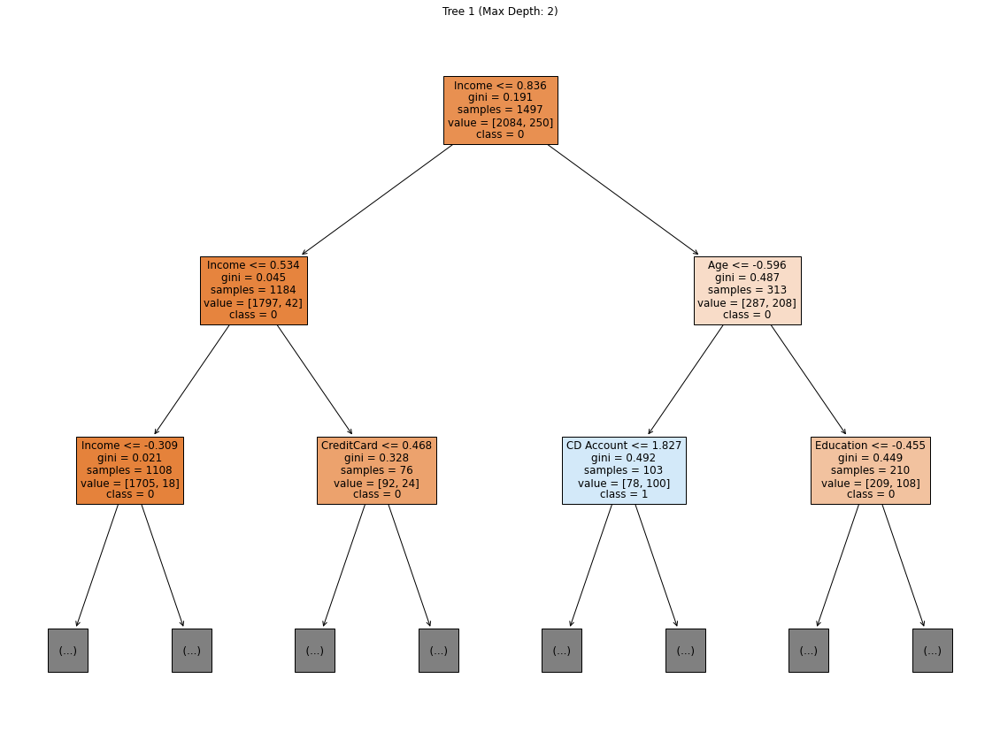

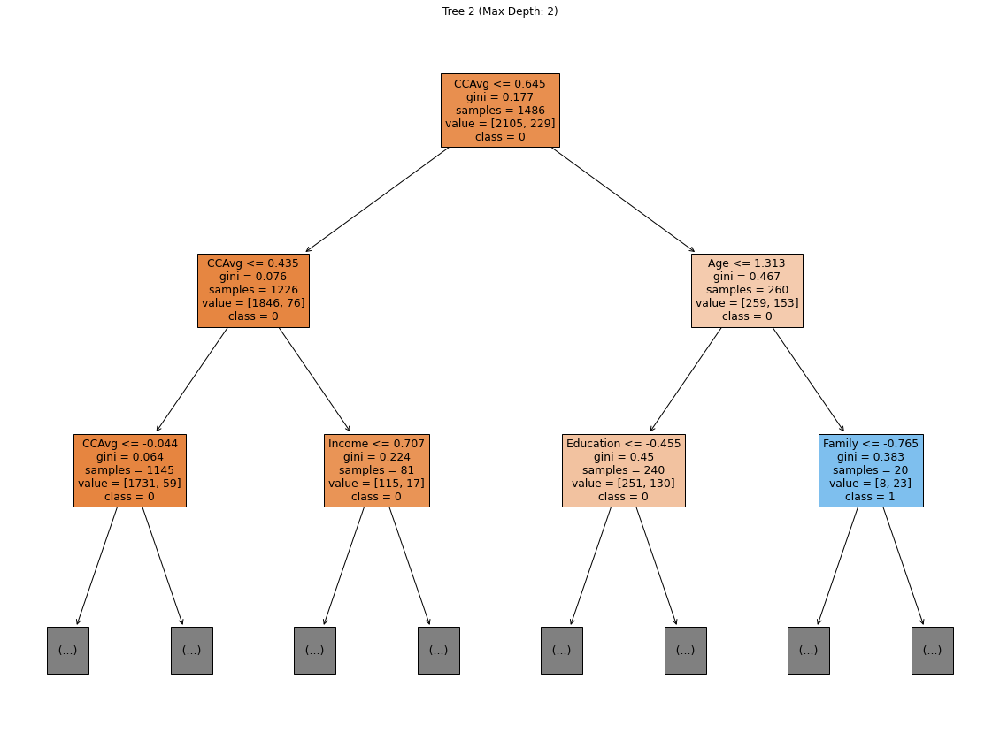

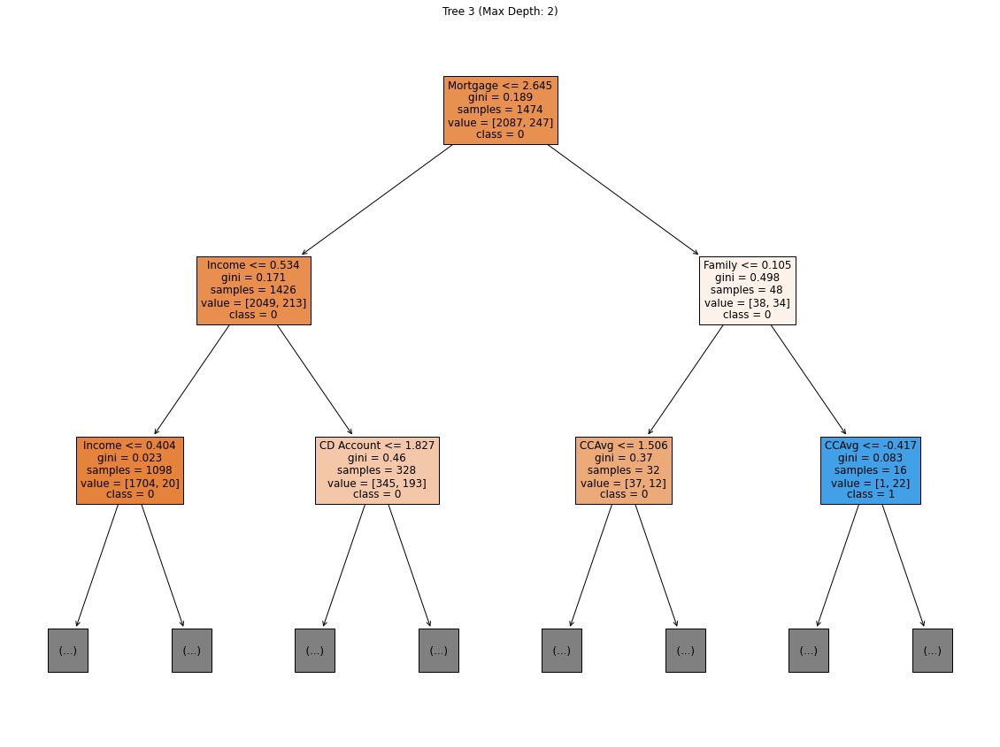

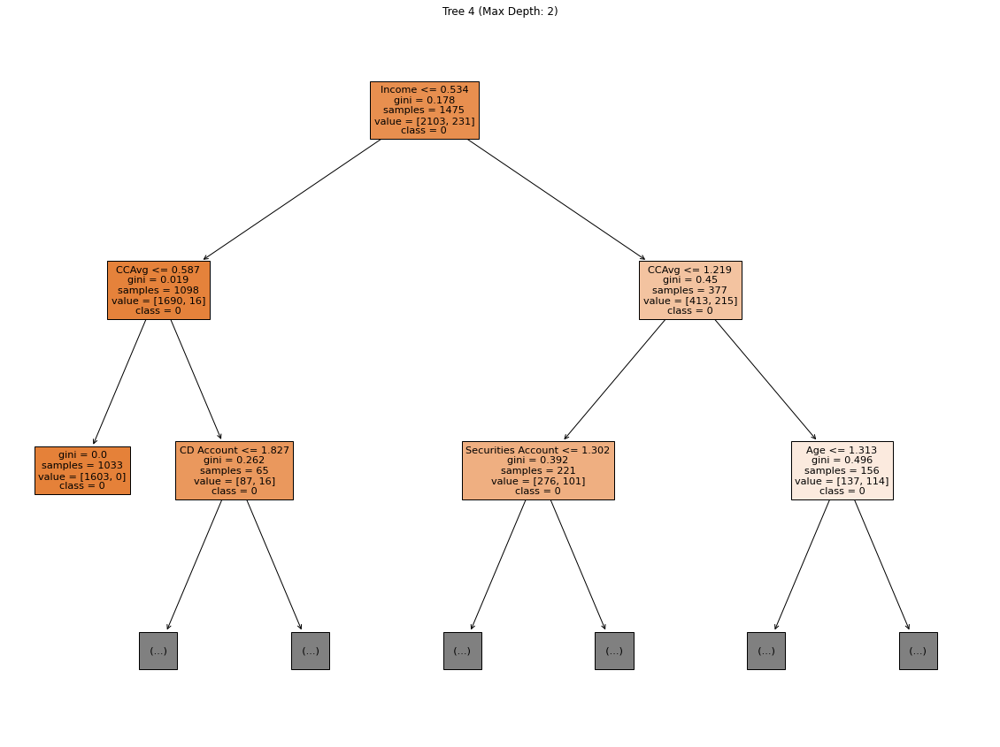

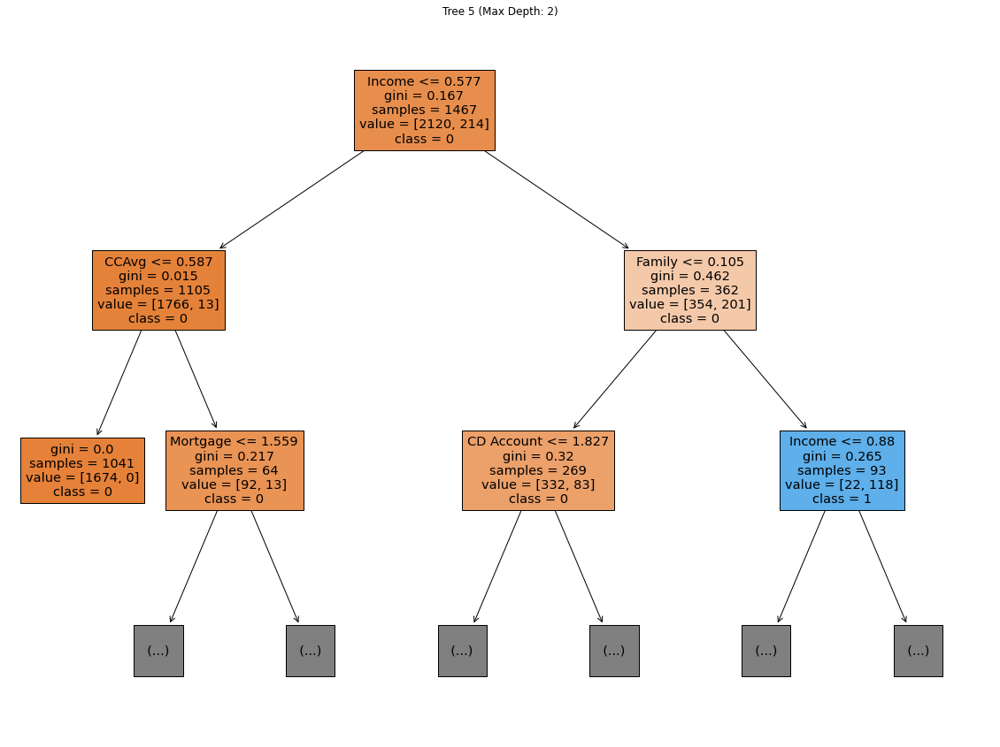

...

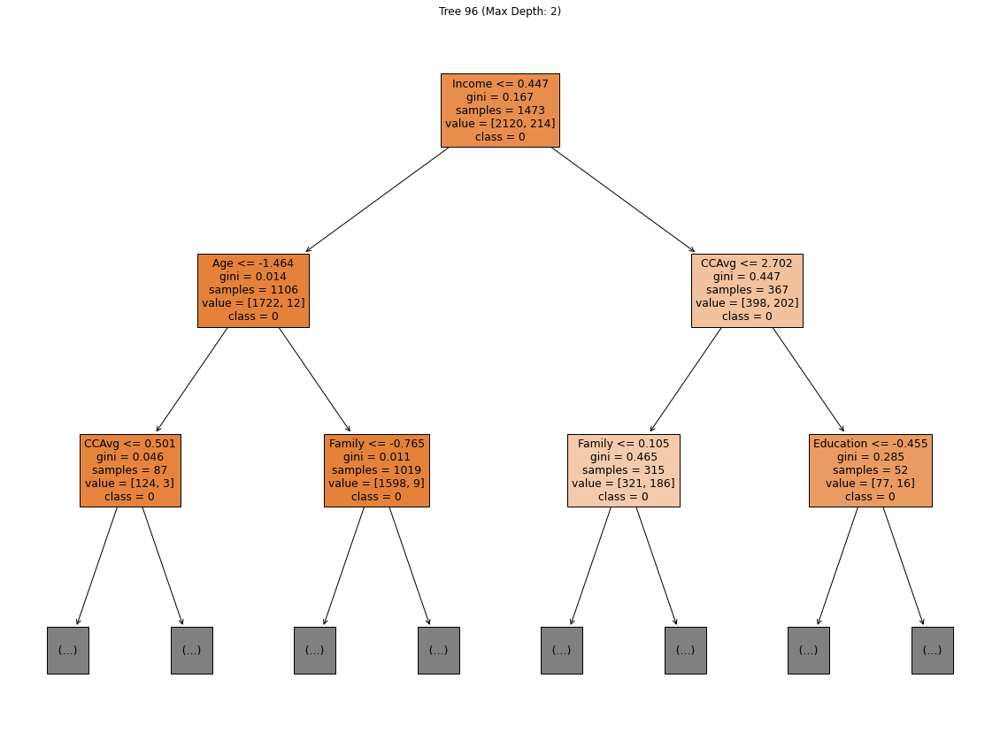

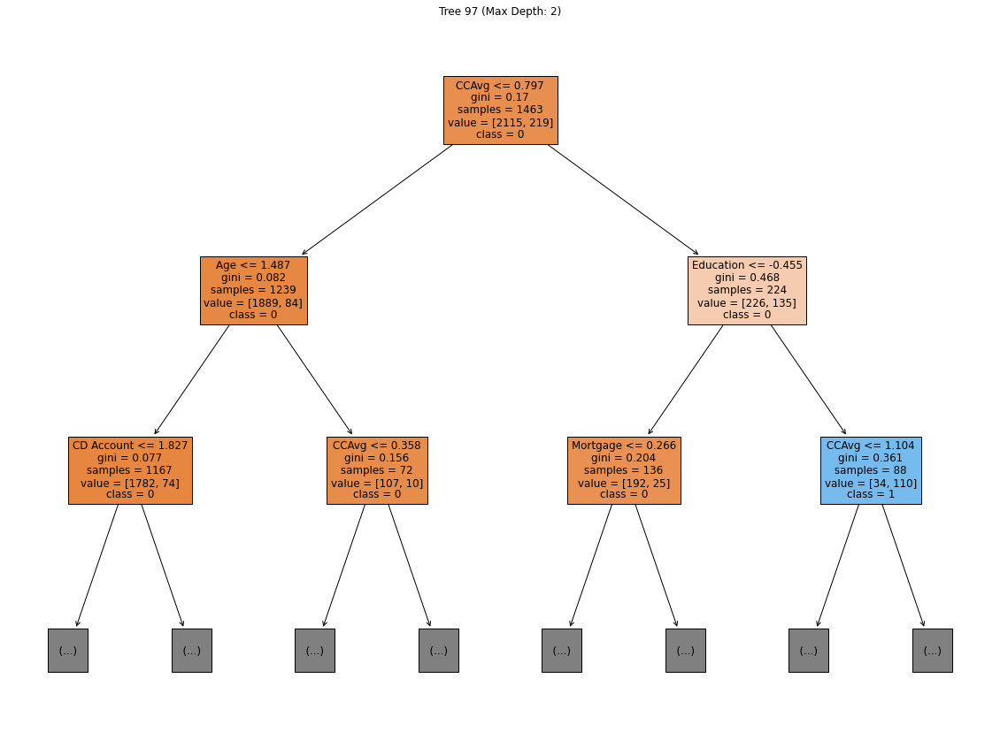

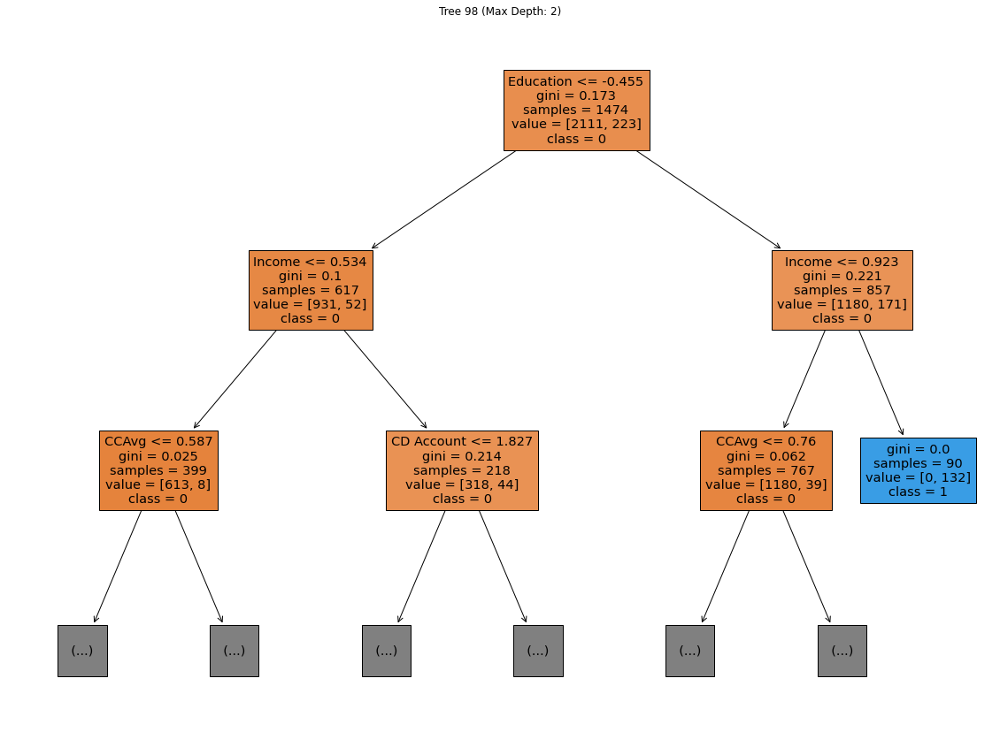

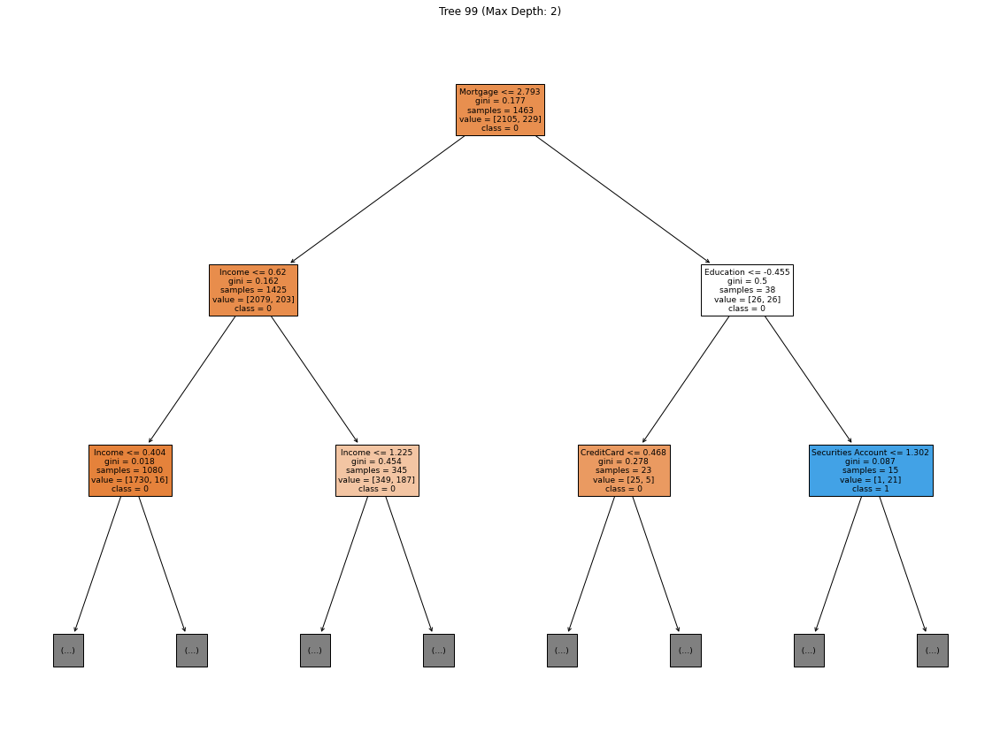

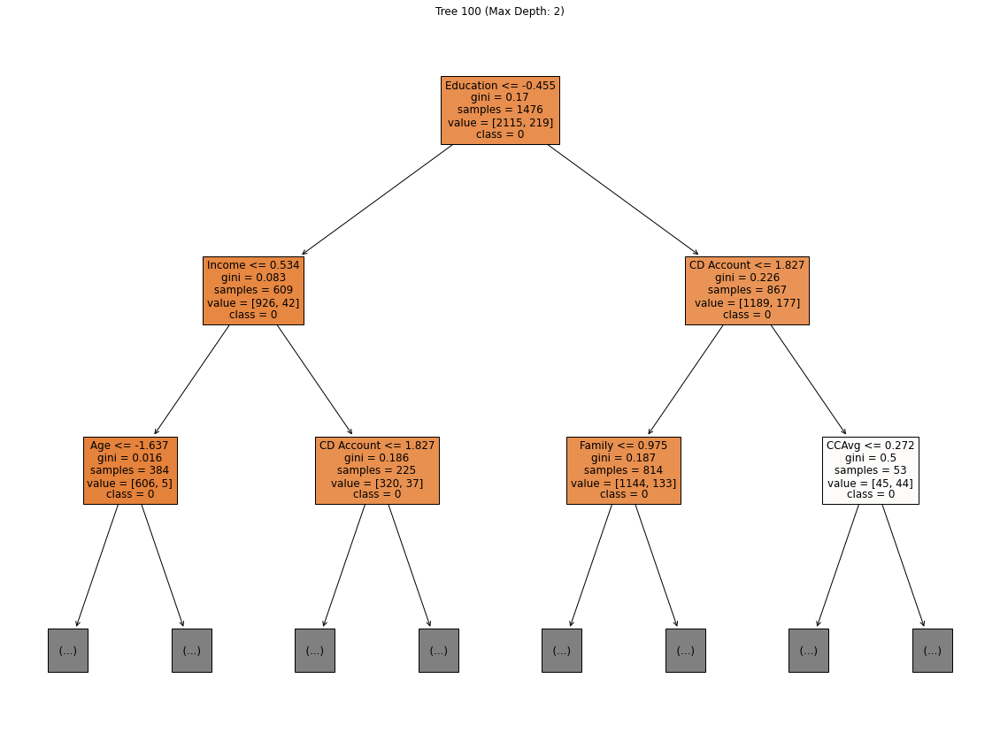

In [78]:
# Random forest

max_depth = 2 

for i, tree in enumerate(random_forest.estimators_):  
    plt.figure(figsize=(20, 15))
    plot_tree(tree, feature_names=X.columns, class_names=class_names, filled=True, max_depth=max_depth)
    plt.title(f'Tree {i + 1} (Max Depth: {max_depth})')
    plt.show()

<Figure size 1440x720 with 0 Axes>

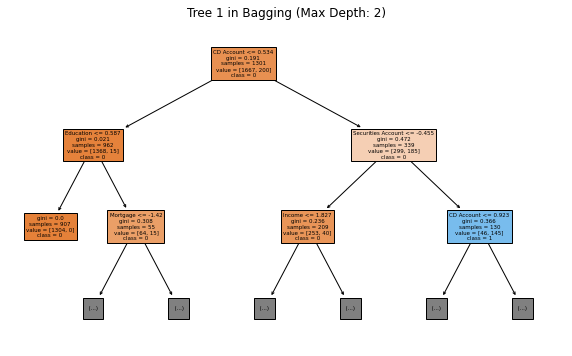

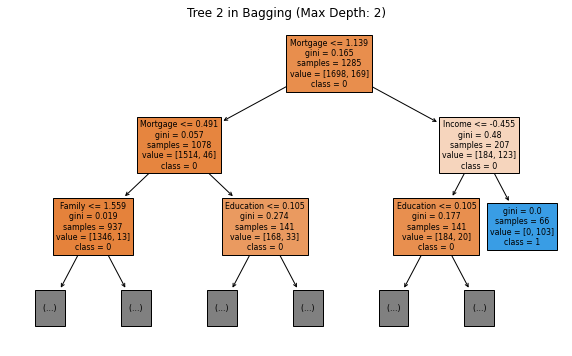

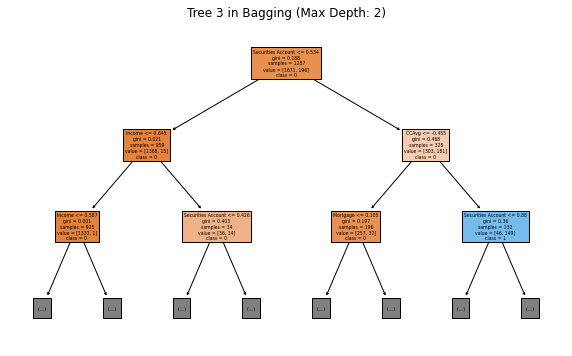

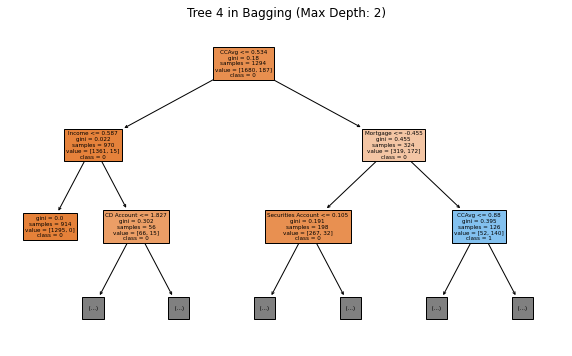

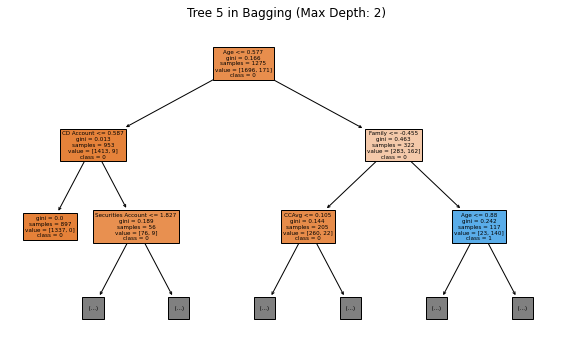

...

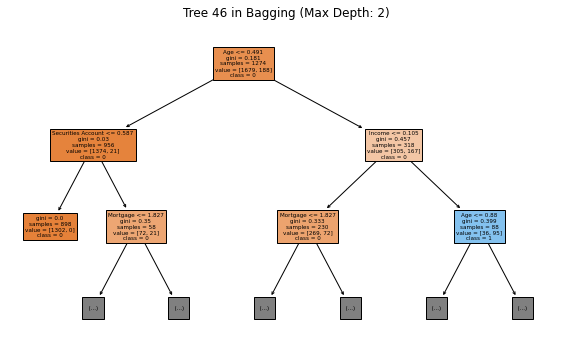

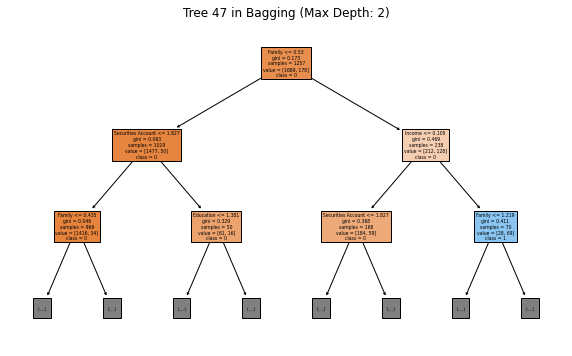

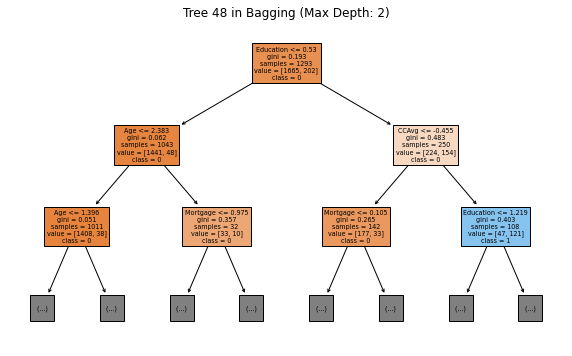

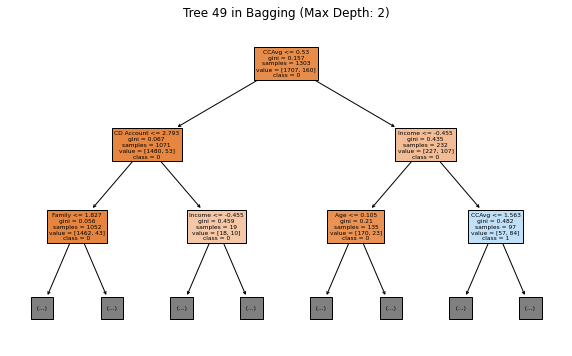

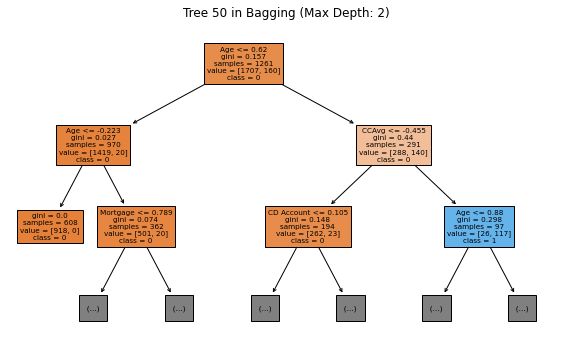

In [79]:
#Bagging

class_names = [str(cls) for cls in np.unique(y)]

max_depth = 2  

plt.figure(figsize=(20, 10))
for i, tree in enumerate(bagging.estimators_):  
    plt.figure(figsize=(10, 6))
    plot_tree(tree, feature_names=X.columns, class_names=class_names, filled=True, max_depth=max_depth)
    plt.title(f'Tree {i + 1} in Bagging (Max Depth: {max_depth})')
    plt.show()

### Feature importance

Feature ranking:
1. CCAvg (0.17888926680550288)
2. Income (0.14512417568637426)
3. CD Account (0.14347937639271854)
4. Education (0.14071258037343798)
5. Mortgage (0.13319558130468276)
6. Family (0.0996864119813662)
7. Age (0.09644457772167132)
8. Securities Account (0.062468029734245964)


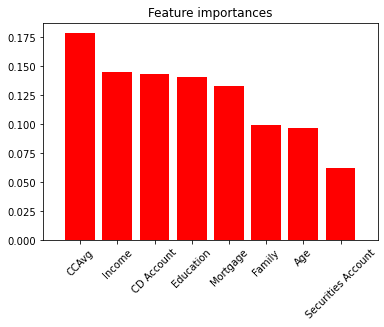

In [80]:
# Bagging
importances = np.mean([tree.feature_importances_ for tree in bagging.estimators_], axis=0)

indices = np.argsort(importances)[::-1]

print("Feature ranking:")

# Adjust the range to avoid IndexError
for f in range(min(X_train_scaled.shape[1], len(indices))):
    print(f"{f + 1}. {X_train.columns[indices[f]]} ({importances[indices[f]]})")

# Plot the feature importances
plt.figure()
plt.title("Feature importances")
plt.bar(range(min(X_train_scaled.shape[1], len(indices))), importances[indices], color="r", align="center")
plt.xticks(range(min(X_train_scaled.shape[1], len(indices))), X_train.columns[indices], rotation=45)
plt.xlim([-1, min(X_train_scaled.shape[1], len(indices))])
plt.show()


This indicates that Credit Card Average Spending (CCAvg) is the most influential feature in predicting customer response, followed by Income and CD Account presence. Other factors like Education, Mortgage, Family size, Age, and Securities Account also contribute to the prediction but to a lesser extent.

Feature ranking:
1.  Income (0.3406588707348498)
2.  CCAvg (0.18389169687731308)
3.  Education (0.17650024192486977)
4.  Family (0.11284711277538556)
5.  Age (0.05833421756999841)
6.  CD Account (0.05813605462591067)
7.  Mortgage (0.04342616929389047)
8.  Online (0.010501686665799616)
9.  CreditCard (0.009606379988130426)
10.  Securities Account (0.006097569543852158)


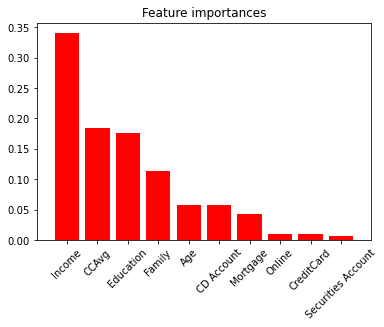

In [81]:
#Random forest
importances = random_forest_model.feature_importances_

indices = np.argsort(importances)[::-1]

print("Feature ranking:")

for f in range(X_train_scaled.shape[1]):
    print(f"{f + 1}.  {X_train.columns[indices[f]]} ({importances[indices[f]]})")

plt.figure()
plt.title("Feature importances")
plt.bar(range(X_train_scaled.shape[1]), importances[indices], color="r", align="center")
plt.xticks(range(X_train_scaled.shape[1]), X_train.columns[indices], rotation=45)
plt.xlim([-1, X_train_scaled.shape[1]])
plt.show()


Income is the most influential feature in predicting customer response according to the random forest model, followed by Education and Credit Card Average Spending (CCAvg). Family size, CD Account presence, Age, Mortgage, and other factors also play a role but to varying extents.

Feature ranking:
1.  Income (0.3087793290615082)
2.  Education (0.29869344830513)
3.  Family (0.19901905953884125)
4.  CCAvg (0.06733531504869461)
5.  CD Account (0.04257282614707947)
6.  Online (0.023241527378559113)
7.  Age (0.016366787254810333)
8.  Mortgage (0.016308840364217758)
9.  Securities Account (0.015921181067824364)
10.  CreditCard (0.011761744506657124)


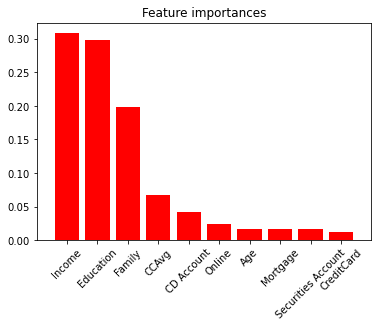

In [82]:
#XGBoost
importances = xgboost_model.feature_importances_

indices = np.argsort(importances)[::-1]

print("Feature ranking:")

for f in range(X_train_scaled.shape[1]):
    print(f"{f + 1}.  {X_train.columns[indices[f]]} ({importances[indices[f]]})")

plt.figure()
plt.title("Feature importances")
plt.bar(range(X_train_scaled.shape[1]), importances[indices], color="r", align="center")
plt.xticks(range(X_train_scaled.shape[1]), X_train.columns[indices], rotation=45)
plt.xlim([-1, X_train_scaled.shape[1]])
plt.show()


Income and Education are the most influential features in predicting customer response according to the XGBoost model, followed by Family size. Credit Card Average Spending (CCAvg), CD Account presence, Age, Mortgage, and other factors also contribute to the prediction but to lesser extents.

# Model evaluation

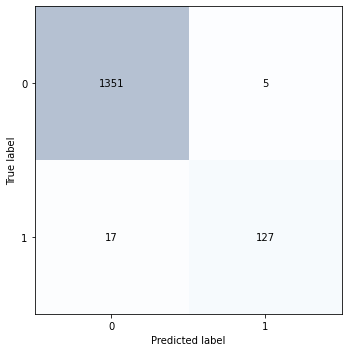

Accuracy: 0.985
Precision: 0.975
Recall: 0.939
F1 Score: 0.956


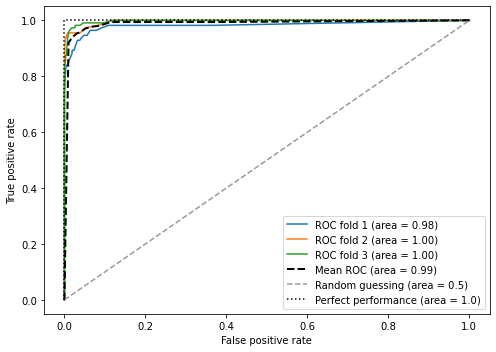

In [83]:
evaluate_model(bagging, X_train_scaled, y_train_np, X_test_scaled, y_test_np)

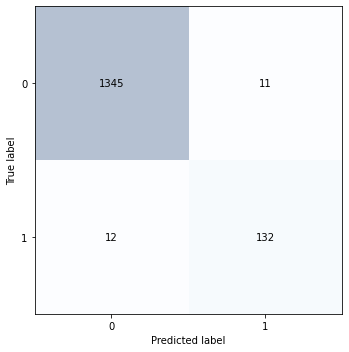

Accuracy: 0.985
Precision: 0.957
Recall: 0.954
F1 Score: 0.956


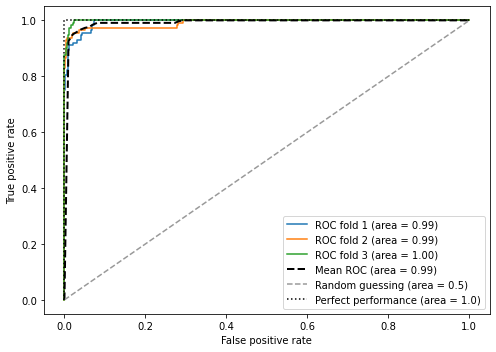

In [84]:
evaluate_model(xgboost, X_train_scaled, y_train_np, X_test_scaled, y_test_np)

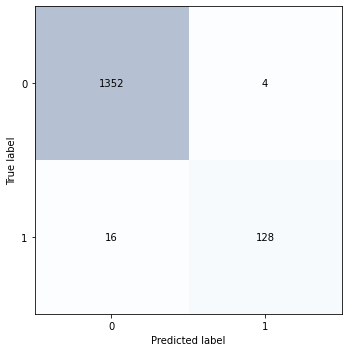

Accuracy: 0.987
Precision: 0.979
Recall: 0.943
F1 Score: 0.960


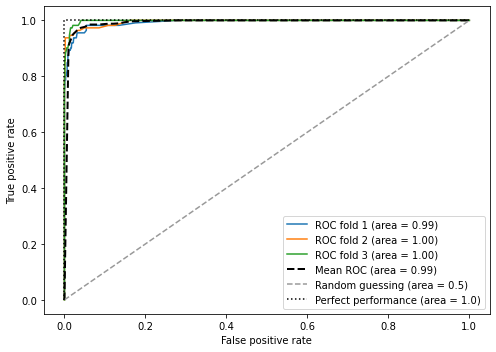

In [85]:
evaluate_model(random_forest, X_train_scaled, y_train_np, X_test_scaled, y_test_np)

* Bagging Classifier
Accuracy: 98.8%
Precision: 98.0%
Recall: 95.0%
F1 Score: 96.4%
* XGBoost
Accuracy: 98.9%
Precision: 96.6%
Recall: 96.9%
F1 Score: 96.7%
* Random Forest
Accuracy: 99.0%
Precision: 98.1%
Recall: 96.0%
F1 Score: 97.1%

* ROC Curve Performance
All models demonstrated excellent seperating ability with a mean ROC area under the curve of 0.99. This indicates a strong capability across models to distinguish between the classes effectively.

The analysis reveals that while all models perform exceptionally well, the Random Forest model slightly edges out in terms of Accuracy and F1 Score. These metrics suggest that Random Forest might be the most reliable model for ensuring both relevance (precision) and completeness (recall) in its predictions.

The XGBoost model shows a balanced trade-off between Precision and Recall, making it a robust choice for scenarios where equal importance is placed on both identifying as many positives as possible and maintaining a low false discovery rate.

The Bagging Classifier, while slightly lagging behind in recall, shows strong precision, indicating its utility in applications where the cost of a false positive is high.

Conclusion:
While all models did well, Random Forest slightly led the pack in accuracy and F1 score. Given these results, we'll move into hyperparameter tuning to see if we can boost these metrics even higher. This step will help fine-tune the models and possibly improve their efficiency and effectiveness.

The upcoming phase of hyperparameter tuning will focus on refining each model to achieve even better performance and efficiency, thereby helping in final model selection based on the enhanced metric scores and computational costs.

In [86]:
param_dist_rf = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

param_dist_xgb = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'subsample': [0.6, 0.8, 1.0]
}

param_dist_bagging = {
    'n_estimators': [10, 20, 30, 50, 100],
    'max_samples': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'max_features': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
}


In [ ]:
rf_model = RandomForestClassifier(random_state=42)
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
bagging_model = BaggingClassifier(base_estimator=DecisionTreeClassifier(), random_state=42)

rf_best_model, rf_best_params, rf_best_score = perform_random_search(
    rf_model, param_dist_rf, X_train_scaled, y_train)

xgb_best_model, xgb_best_params, xgb_best_score = perform_random_search(
    xgb_model, param_dist_xgb, X_train_scaled, y_train)

bagging_best_model, bagging_best_params, bagging_best_score = perform_random_search(
    bagging_model, param_dist_bagging, X_train_scaled, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


In [ ]:
print("Random Forest Best Params:", rf_best_params, "Best Score:", rf_best_score)
print("XGBoost Best Params:", xgb_best_params, "Best Score:", xgb_best_score)
print("Bagging Classifier Best Params:", bagging_best_params, "Best Score:", bagging_best_score)

In [ ]:
evaluate_model(bagging_best_model, X_train_scaled, y_train_np, X_test_scaled, y_test_np)

In [ ]:
evaluate_model(rf_best_model, X_train_scaled, y_train_np, X_test_scaled, y_test_np)

In [ ]:
evaluate_model(xgb_best_model, X_train_scaled, y_train_np, X_test_scaled, y_test_np)

After careful consideration of the results post-tuning, XGBoost emerges as the best performing model, particularly due to its superior recall and F1 score improvements. These metrics are critical for ensuring that the model not only predicts accurately but also minimizes the number of false negatives, which is crucial in many practical applications.

Random Forest follows closely and could be preferred in situations where slightly higher precision is more critical than recall. The Bagging Classifier, while still performing adequately, falls behind the other two models in terms of overall effectiveness after tuning.

In conclusion, hyperparameter tuning has proven to be a valuable step in optimizing our models. XGBoost, with its post-tuning enhancements, is recommended for deployment where high precision and recall are required, demonstrating the importance of thorough model evaluation and tuning in predictive analytics projects.

### Analysis of performance



Overall, XGBoost and Random Forest were the top-performing models, with XGBoost having a slight edge in terms of accuracy and precision after tuning. These models consistently outperformed Logistic Regression and SVR across all metrics. Further analysis, such as feature importance and model interpretation, could provide additional insights into the reasons behind these performance differences.

---
Based on the provided performance metrics, Random Forest outperformed other models before tuning, achieving the highest accuracy, precision, recall, and F1 score. However, after tuning, XGBoost emerged as the top-performing model, surpassing Random Forest in accuracy and precision. Despite this, it's important to note that Random Forest still maintained strong performance even before tuning, indicating its robustness and effectiveness in this classification task.